In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import matplotlib.animation as animation

In [3]:
mitbih_train = pd.read_csv('mitbih_train.csv', header = None)

In [4]:
df_train = pd.DataFrame(mitbih_train)
df_train = df_train.rename(columns ={187 : 'label'})
df_train
df_train.label.unique()

array([0., 1., 2., 3., 4.])

In [5]:
df_zero = df_train[df_train['label'] == 0]
df_one = df_train[df_train['label'] == 1]
df_two = df_train[df_train['label'] == 2]
df_three = df_train[df_train['label'] == 3]
df_four = df_train[df_train['label'] == 4]

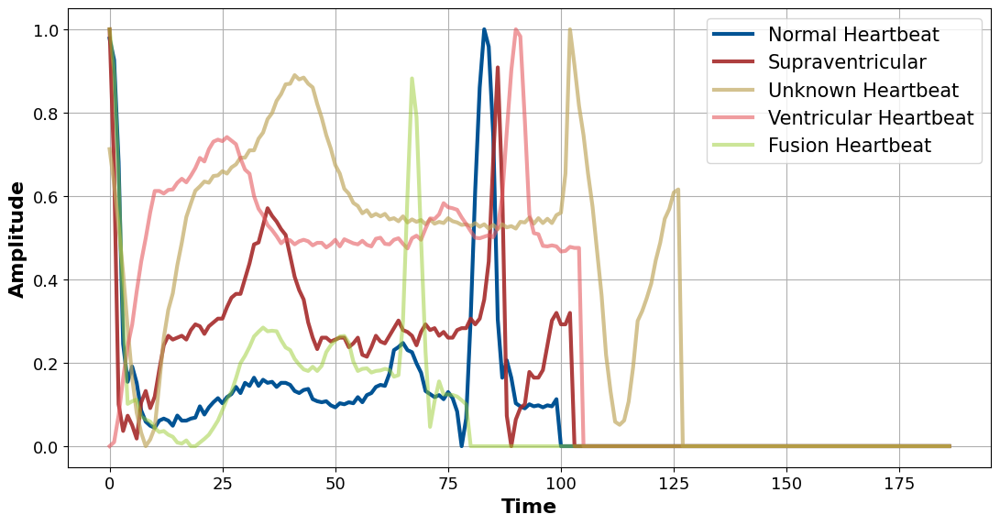

In [6]:
plt.figure(figsize=(13, 6.5))

fontsizelabels = 16
fontsizeticks = 13
fontsizelegend = 15

#plt.subplot(2, 2, 1)
plt.plot(df_zero.iloc[0, :187], color='#005394', label='Normal Heartbeat',linewidth=3, alpha=1)
plt.plot(df_one.iloc[0, :187], color='brown', label='Supraventricular', linewidth=3, alpha=.9)
plt.plot(df_four.iloc[0, :187], color='#c1a961', label='Unknown Heartbeat', linewidth=3, alpha = .7 )
plt.plot(df_two.iloc[0, :187], color='#e55a60', label='Ventricular Heartbeat',linewidth=3, alpha = .6)
plt.plot(df_three.iloc[0, :187], color='yellowgreen', label='Fusion Heartbeat',linewidth=3, alpha = .5)
plt.xlabel('Time', fontsize = fontsizelabels, fontweight = 'bold')
plt.ylabel('Amplitude', fontsize = fontsizelabels, fontweight = 'bold')
plt.xticks(fontsize = fontsizeticks)
plt.yticks(fontsize = fontsizeticks)
plt.grid(True)

plt.legend(fontsize=fontsizelegend)

plt.show()

In [7]:
print(df_zero.iloc[0,:187])

0      0.977941
1      0.926471
2      0.681373
3      0.245098
4      0.154412
         ...   
182    0.000000
183    0.000000
184    0.000000
185    0.000000
186    0.000000
Name: 0, Length: 187, dtype: float64


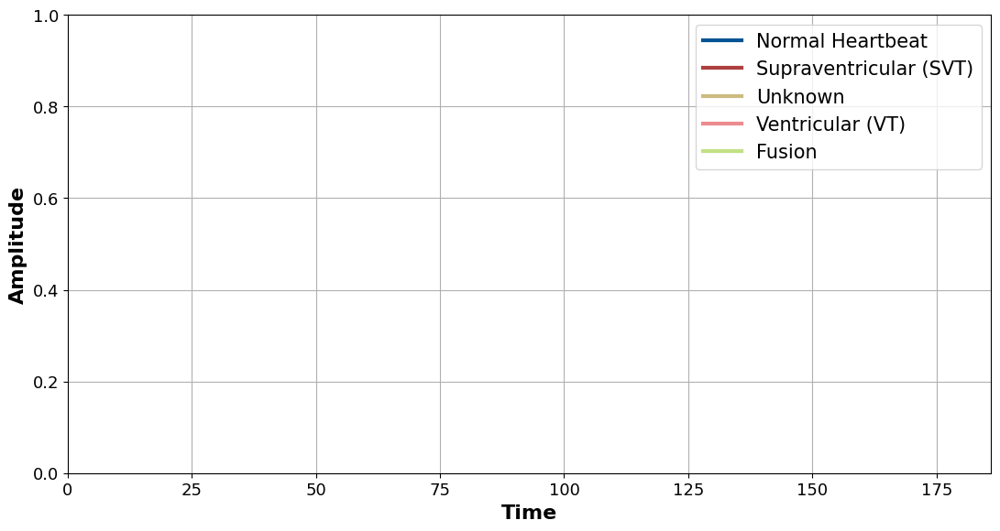

In [15]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np

# Assuming df_zero, df_one, df_four, df_two, df_three are your dataframes

fig = plt.figure(figsize=(13, 6.5))
ax = fig.add_subplot(1, 1, 1)

fontsizelabels = 16
fontsizeticks = 13
fontsizelegend = 15

lines = []
colors = ['#005394', 'brown', '#c1a961', '#e55a60', 'yellowgreen']
labels = ['Normal Heartbeat', 'Supraventricular (SVT)', 'Unknown', 'Ventricular (VT)', 'Fusion']
alphas = [1, 0.9, 0.8, 0.7, 0.6]
dataframes = [df_zero, df_one, df_four, df_two, df_three]

# Set fixed x and y limits
x_min = 0
x_max = 186  # Assuming 187 data points (0 to 186)
y_min = min(df.iloc[0, :187].min() for df in dataframes)
y_max = max(df.iloc[0, :187].max() for df in dataframes)

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

for i, df in enumerate(dataframes):
    line, = ax.plot([], [], color=colors[i], label=labels[i], linewidth=3, alpha=alphas[i])
    lines.append(line)

ax.set_xlabel('Time', fontsize=fontsizelabels, fontweight='bold')
ax.set_ylabel('Amplitude', fontsize=fontsizelabels, fontweight='bold')
ax.tick_params(axis='both', which='major', labelsize=fontsizeticks)
ax.grid(True)
ax.legend(fontsize=fontsizelegend)

def init():
    for line in lines:
        line.set_data([], [])
    return lines

def animate(frame):
    for i, line in enumerate(lines):
        x = np.arange(frame + 1)
        y = dataframes[i].iloc[0, :frame + 1]
        line.set_data(x, y)
    return lines

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=187, interval=50, blit=True)

plt.show()

In [16]:
from IPython.display import HTML
HTML(anim.to_html5_video())

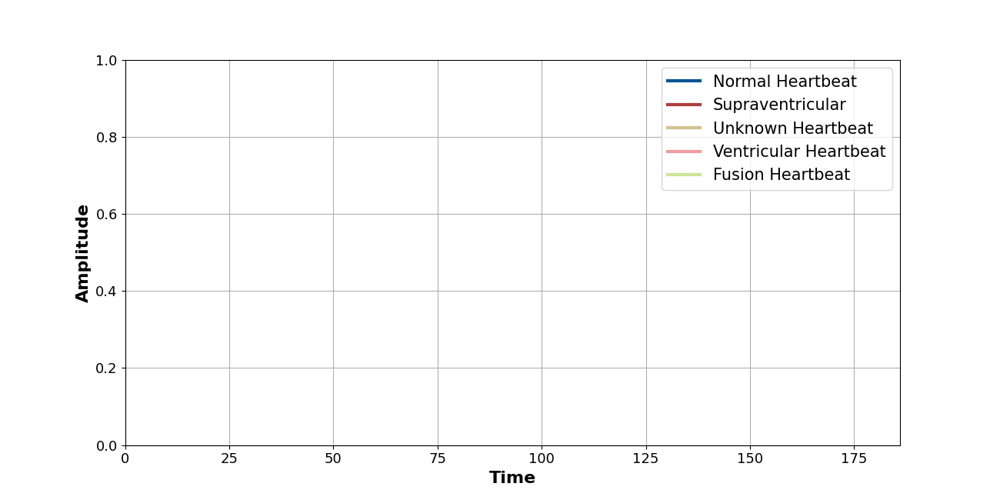

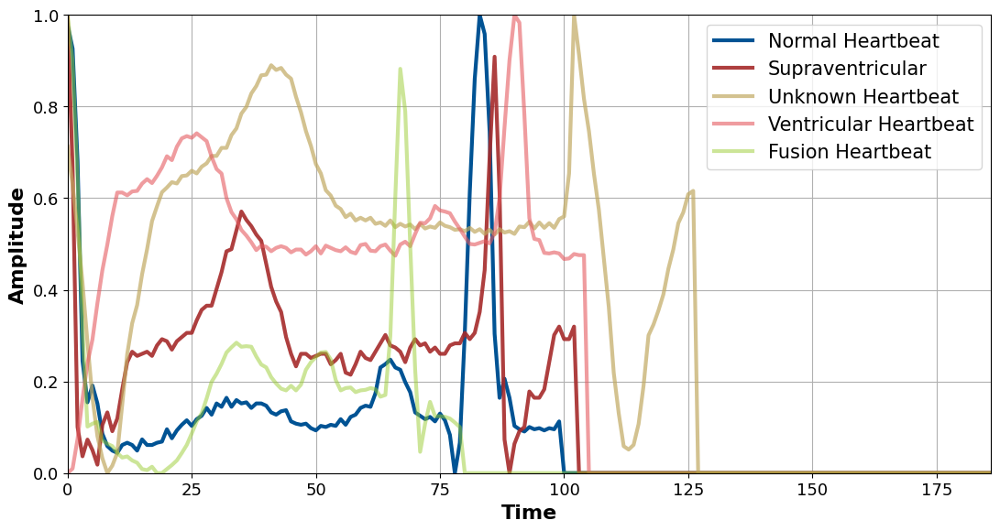

In [17]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import imageio
from IPython.display import Image, display

# Assuming df_zero, df_one, df_four, df_two, df_three are your dataframes

fig = plt.figure(figsize=(13, 6.5))
ax = fig.add_subplot(1, 1, 1)

fontsizelabels = 16
fontsizeticks = 13
fontsizelegend = 15

lines = []
colors = ['#005394', 'brown', '#c1a961', '#e55a60', 'yellowgreen']
labels = ['Normal Heartbeat', 'Supraventricular', 'Unknown Heartbeat', 'Ventricular Heartbeat', 'Fusion Heartbeat']
alphas = [1, 0.9, 0.7, 0.6, 0.5]
dataframes = [df_zero, df_one, df_four, df_two, df_three]

# Set fixed x and y limits
x_min = 0
x_max = 186  # Assuming 187 data points (0 to 186)
y_min = min(df.iloc[0, :187].min() for df in dataframes)
y_max = max(df.iloc[0, :187].max() for df in dataframes)

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

for i, df in enumerate(dataframes):
    line, = ax.plot([], [], color=colors[i], label=labels[i], linewidth=3, alpha=alphas[i])
    lines.append(line)

ax.set_xlabel('Time', fontsize=fontsizelabels, fontweight='bold')
ax.set_ylabel('Amplitude', fontsize=fontsizelabels, fontweight='bold')
ax.tick_params(axis='both', which='major', labelsize=fontsizeticks)
ax.grid(True)
ax.legend(fontsize=fontsizelegend)

def animate(frame):
    for i, line in enumerate(lines):
        x = np.arange(frame + 1)
        y = dataframes[i].iloc[0, :frame + 1]
        line.set_data(x, y)
    return lines

# Create and save the animation
frames = []
for frame in range(187):
    animate(frame)
    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    frames.append(image)

imageio.mimsave('/content/heartbeat_animation.gif', frames, fps=20)

# Display the GIF
display(Image(filename='/content/heartbeat_animation.gif'))